### import pypower

In [ ]:
import pypower

### solve AC OPF

In [ ]:
import pypower.api as pyp

def solve_ac_opf():
    # Load the IEEE 9-bus system
    case = pyp.case9()

    # Solve the AC Optimal Power Flow (AC OPF)
    results = pyp.runopf(case)

    # Print the results
    pyp.printpf(results)

if __name__ == "__main__":
    solve_ac_opf()


PYPOWER Version 5.1.16, 05-March-2023 -- AC Optimal Power Flow
Python Interior Point Solver - PIPS, Version 1.0, 07-Feb-2011
Converged!

Converged in 1.53 seconds
Objective Function Value = 5296.69 $/hr
|     System Summary                                                           |

How many?                How much?              P (MW)            Q (MVAr)
---------------------    -------------------  -------------  -----------------
Buses              9     Total Gen Capacity     820.0        -900.0 to 900.0
Generators         3     On-line Capacity       820.0        -900.0 to 900.0
Committed Gens     3     Generation (actual)    318.3              -9.6
Loads              3     Load                   315.0             115.0
  Fixed            3       Fixed                315.0             115.0
  Dispatchable     0       Dispatchable           0.0 of 0.0        0.0
Shunts             0     Shunt (inj)              0.0               0.0
Branches           9     Losses (I^2 * Z)      

### Get the nominal values for the demand

In [ ]:
import pypower.api as pyp

def get_nominal_demand():
    # Load the IEEE 9-bus system
    case = pyp.case9()
    
    # Access bus data
    bus_data = case['bus']
    
    # Extract and display nominal demand values for each bus
    print("Bus\tPd (MW)\tQd (MVAR)")
    for i in range(bus_data.shape[0]):
        bus_id = int(bus_data[i, 0])
        Pd = bus_data[i, 2]  # Real power demand (MW)
        Qd = bus_data[i, 3]  # Reactive power demand (MVAR)
        if Pd > 0 or Qd > 0:
            print(f"{bus_id}\t{Pd}\t{Qd}")

if __name__ == "__main__":
    get_nominal_demand()


Bus	Pd (MW)	Qd (MVAR)
5	90.0	30.0
7	100.0	35.0
9	125.0	50.0


### test perturbing the demand

In [ ]:
import numpy as np
import pypower.api as pyp

def perturb_demand(case, num_scenarios, perturbation_percentage):
    # Store the original demand values
    original_Pd = case['bus'][:, 2].copy()
    original_Qd = case['bus'][:, 3].copy()

    # Prepare a list to hold all scenarios
    scenarios = []

    # Generate perturbed scenarios
    for _ in range(num_scenarios):
        new_case = pyp.case9()  # Reload the original case for each scenario
        # Perturb demand values
        for i in range(new_case['bus'].shape[0]):
            if original_Pd[i] > 0:  # Only perturb if there is a non-zero demand
                perturb_factor = 1 + np.random.uniform(-perturbation_percentage, perturbation_percentage)
                new_case['bus'][i, 2] = original_Pd[i] * perturb_factor  # Perturb Pd
            if original_Qd[i] > 0:  # Only perturb if there is a non-zero demand
                perturb_factor = 1 + np.random.uniform(-perturbation_percentage, perturbation_percentage)
                new_case['bus'][i, 3] = original_Qd[i] * perturb_factor  # Perturb Qd
        # Store the perturbed case
        scenarios.append(new_case['bus'][:, [0, 2, 3]])  # Store only bus ID, Pd, Qd
    
    return scenarios

def main():
    num_scenarios = 10  # Number of scenarios to generate
    perturbation_percentage = 0.1  # 10% perturbation

    case = pyp.case9()
    scenarios = perturb_demand(case, num_scenarios, perturbation_percentage)

    # Print the first scenario as an example
    print("Scenario 1:")
    print("Bus\tPd (MW)\tQd (MVAR)")
    for row in scenarios[0]:
        print(f"{int(row[0])}\t{row[1]:.2f}\t{row[2]:.2f}")

if __name__ == "__main__":
    main()


Scenario 1:
Bus	Pd (MW)	Qd (MVAR)
1	0.00	0.00
2	0.00	0.00
3	0.00	0.00
4	0.00	0.00
5	97.93	27.94
6	0.00	0.00
7	95.68	31.94
8	0.00	0.00
9	135.81	53.95


### create the dataset

In [ ]:
import numpy as np
import pandas as pd
import pypower.api as pyp

def perturb_demand_and_solve_opf(case, num_scenarios, perturbation_percentage):
    original_Pd = case['bus'][:, 2].copy()
    original_Qd = case['bus'][:, 3].copy()

    # Prepare lists to hold input demands and output data
    inputs = []
    outputs = []

    # Identify P-Q buses (non-generator buses)
    gen_buses = case['gen'][:, 0].astype(int)  # Buses with generators
    pq_buses = [i for i in range(case['bus'].shape[0]) if i not in gen_buses]

    # Generate perturbed scenarios and solve OPF
    for _ in range(num_scenarios):
        new_case = pyp.case30()  # Reload the original case for each scenario

        # Perturb demand values
        perturbed_Pd = []
        perturbed_Qd = []
        for i in pq_buses:
            if original_Pd[i] > 0:  # Only perturb if there is non-zero demand
                perturb_factor_Pd = 1 + np.random.uniform(-perturbation_percentage, perturbation_percentage)
                new_Pd = original_Pd[i] * perturb_factor_Pd
                new_case['bus'][i, 2] = new_Pd
                perturbed_Pd.append(new_Pd)
            else:
                perturbed_Pd.append(0)
            if original_Qd[i] > 0:
                perturb_factor_Qd = 1 + np.random.uniform(-perturbation_percentage, perturbation_percentage)
                new_Qd = original_Qd[i] * perturb_factor_Qd
                new_case['bus'][i, 3] = new_Qd
                perturbed_Qd.append(new_Qd)
            else:
                perturbed_Qd.append(0)

        # Solve OPF
        opf_result = pyp.runopf(new_case)

        # Collect outputs
        gen_output = opf_result['gen'][:, 1]  # Pg
        voltage_PV = opf_result['bus'][opf_result['gen'][1:, 0].astype(int), 7]  # Vm; skip the slack/reference bus
        voltage_ref = opf_result['bus'][0, 7]  # Vm
        angle_ref = opf_result['bus'][0, 8]  # Va

        # Append to lists
        inputs.append(perturbed_Pd + perturbed_Qd)
        outputs.append(list(gen_output) + list(voltage_PV) + [voltage_ref, angle_ref])

    # Create DataFrame
    pq_labels = [f'Pd_{i+1}' for i in pq_buses] + [f'Qd_{i+1}' for i in pq_buses]
    
    output_labels = ['Vm_ref', 'Va_ref'] + [f'Pg_{i+1}' for i in gen_buses[0:]] + [f'Vm_{i+1}' for i in gen_buses[1:]]

    df_columns = pq_labels + output_labels
    data = [inputs[i] + outputs[i] for i in range(num_scenarios)]
    df = pd.DataFrame(data, columns=df_columns)
    return df


num_scenarios = 1250  # Number of scenarios to generate
perturbation_percentage = 0.1  # 10% perturbation

case = pyp.case30()
df = perturb_demand_and_solve_opf(case, num_scenarios, perturbation_percentage)

# Display the head of the DataFrame
print(df.head())


PYPOWER Version 5.1.16, 05-March-2023 -- AC Optimal Power Flow
Python Interior Point Solver - PIPS, Version 1.0, 07-Feb-2011
Converged!

Converged in 1.50 seconds
Objective Function Value = 592.62 $/hr
|     System Summary                                                           |

How many?                How much?              P (MW)            Q (MVAr)
---------------------    -------------------  -------------  -----------------
Buses             30     Total Gen Capacity     335.0         -95.0 to 405.9
Generators         6     On-line Capacity       335.0         -95.0 to 405.9
Committed Gens     6     Generation (actual)    196.3              96.6
Loads             20     Load                   193.8             103.6
  Fixed           20       Fixed                193.8             103.6
  Dispatchable     0       Dispatchable           0.0 of 0.0        0.0
Shunts             2     Shunt (inj)             -0.0               0.2
Branches          41     Losses (I^2 * Z)       

In [ ]:
# store the dataset in an a CSV file
df.to_csv('dataset.csv', index=False)

In [ ]:
df.head()

,Pd_1,Pd_4,Pd_5,Pd_6,Pd_7,Pd_8,Pd_9,Pd_10,Pd_11,Pd_12,...,Pg_3,Pg_23,Pg_28,Pg_24,Pg_14,Vm_3,Vm_23,Vm_28,Vm_24,Vm_14
0,0,7.362566,0,0,22.729769,30.064700,0,5.673463,0,12.304582,...,36.601252,17.150486,17.598210,1.023313,1.046283,1.020336,1.034245,1.031377,1.037671,0.0
1,0,8.249133,0,0,21.077754,29.437790,0,5.765340,0,11.322941,...,36.877988,16.528281,16.740595,1.010164,1.044321,1.009788,1.032512,1.028015,1.020887,0.0
2,0,7.485323,0,0,23.858423,32.471577,0,5.577918,0,11.086439,...,55.195808,26.549038,40.215972,0.967504,1.035475,0.973464,1.013245,1.008542,0.972622,0.0
3,0,8.223581,0,0,24.989899,30.820413,0,5.633429,0,10.815886,...,52.478169,25.378079,40.000000,0.973363,1.045438,0.979448,1.019368,1.017054,0.973946,0.0
4,0,7.473514,0,0,20.723818,29.085187,0,6.003216,0,10.105659,...,35.415646,16.101700,16.267450,1.009564,1.042382,1.008939,1.031401,1.026676,1.020584,0.0


### data preprocessing

In [ ]:
df = pd.read_csv('dataset.csv')

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Assuming `df` is the DataFrame generated from the previous steps

# Prepare the dataset
features = df[[col for col in df.columns if 'Pd' in col or 'Qd' in col]].values
labels = df[[col for col in df.columns if col not in features]].values

# Scale the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

In [ ]:
from sklearn.model_selection import train_test_split

# Splitting the data into training and validation sets
features_train, features_test, labels_train, labels_test = train_test_split(
    features_scaled, 
    labels, 
    test_size=0.2,  # 20% of the data is used for the validation set
    random_state=42  # Ensures reproducibility
)

# Convert to PyTorch tensors
features_train_tensor = torch.tensor(features_train, dtype=torch.float32)
labels_train_tensor = torch.tensor(labels_train, dtype=torch.float32)
features_test_tensor = torch.tensor(features_test, dtype=torch.float32)
labels_test_tensor = torch.tensor(labels_test, dtype=torch.float32)

# Create datasets and dataloaders for both training and validation
train_dataset = TensorDataset(features_train_tensor, labels_train_tensor)
test_dataset = TensorDataset(features_test_tensor, labels_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=10, shuffle=False)


### neural network architecture

In [ ]:
# Define the neural network
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(features_train.shape[1], 64)
        self.layer2 = nn.Linear(64, 32)
        self.output_layer = nn.Linear(32, labels_train.shape[1])
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.relu(self.layer1(x))
        x = self.relu(self.layer2(x))
        x = self.output_layer(x)
        return x


In [ ]:
model = NeuralNetwork()

### train the neural network

In [ ]:
# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
train_losses = []
test_losses = []    

# Training loop
num_epochs = 200
for epoch in range(num_epochs):
    model.train()
    train_loss = 0
    for inputs, targets in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    train_losses.append(train_loss / len(train_loader))


    model.eval()
    test_loss = 0
    with torch.no_grad():
        for inputs, targets in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
    test_losses.append(test_loss / len(test_loader))

    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss / len(train_loader)}, Test Loss: {test_loss / len(test_loader)}')


Epoch 1/1000, Train Loss: 153.90129180908204, Test Loss: 90.42829986572265
Epoch 2/1000, Train Loss: 34.68153611183166, Test Loss: 13.987633590698243
Epoch 3/1000, Train Loss: 12.513661022186279, Test Loss: 12.597434673309326
Epoch 4/1000, Train Loss: 11.914121541976929, Test Loss: 12.052325401306152
Epoch 5/1000, Train Loss: 11.25656802892685, Test Loss: 11.100551929473877
Epoch 6/1000, Train Loss: 10.046798765659332, Test Loss: 9.570502433776856
Epoch 7/1000, Train Loss: 8.374340411424637, Test Loss: 7.836726455688477
Epoch 8/1000, Train Loss: 6.870539617538452, Test Loss: 6.603299341201782
Epoch 9/1000, Train Loss: 5.862103214263916, Test Loss: 5.9549312400817875
Epoch 10/1000, Train Loss: 5.255253989696502, Test Loss: 5.4784026718139645
Epoch 11/1000, Train Loss: 4.840152291059494, Test Loss: 5.132213554382324
Epoch 12/1000, Train Loss: 4.491741960048675, Test Loss: 4.867608880996704
Epoch 13/1000, Train Loss: 4.200371417999268, Test Loss: 4.621028299331665
Epoch 14/1000, Train Los

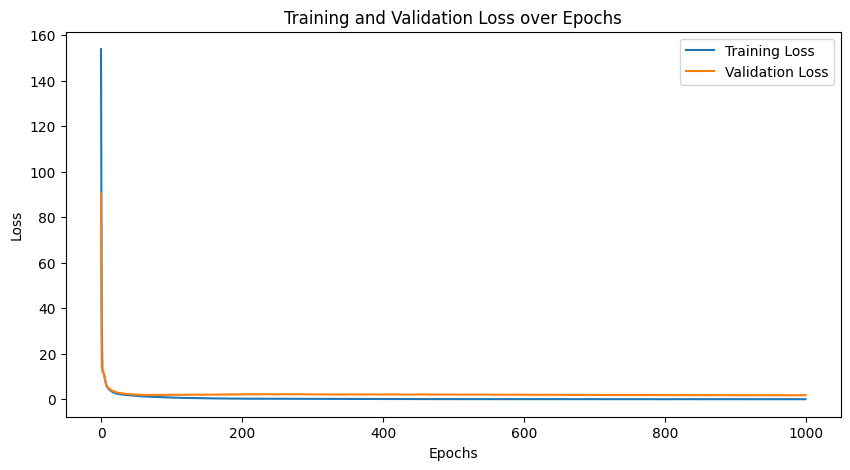

In [ ]:
import matplotlib.pyplot as plt

# Plotting the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(test_losses, label='Validation Loss')
plt.title('Training and Validation Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np
import math

# Evaluate the model on the test set
model.eval()
test_predictions = []
test_targets = []
with torch.no_grad():
    for inputs, targets in test_loader:
        outputs = model(inputs)
        test_predictions.extend(outputs.numpy())
        test_targets.extend(targets.numpy())

test_predictions = np.array(test_predictions)
test_targets = np.array(test_targets)

mse = mean_squared_error(test_targets, test_predictions)
rmse = math.sqrt(mse)
mae = mean_absolute_error(test_targets, test_predictions)

print(f'Test MSE: {mse}')
print(f'Test RMSE: {rmse}')
print(f'Test MAE: {mae}')

Test MSE: 1.8105062246322632
Test RMSE: 1.345550528457502
Test MAE: 0.2721966505050659


### confidence interval on the training

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np

# Assuming `model`, `train_loader`, `test_loader`, and `criterion` are defined

num_epochs = 50
num_repeats = 5
train_losses = []
test_losses = []

for repeat in range(num_repeats):
    model.apply(lambda m: m.reset_parameters() if hasattr(m, 'reset_parameters') else None)  # Reset model parameters
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    train_loss_run = []
    test_loss_run = []
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_loss_run.append(train_loss / len(train_loader))

        model.eval()
        test_loss = 0
        with torch.no_grad():
            for inputs, targets in test_loader:
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                test_loss += loss.item()
        test_loss_run.append(test_loss / len(test_loader))

        print(f'Repeat {repeat+1}, Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss / len(train_loader)}, Test Loss: {test_loss / len(test_loader)}')
    
    train_losses.append(train_loss_run)
    test_losses.append(test_loss_run)

# Convert to numpy arrays for easy statistical operations
train_losses = np.array(train_losses)
test_losses = np.array(test_losses)

# Calculate means and confidence intervals
train_mean = train_losses.mean(axis=0)
test_mean = test_losses.mean(axis=0)

train_std = train_losses.std(axis=0)
test_std = test_losses.std(axis=0)

confidence_interval = 1.96  # For 95% confidence

train_ci_lower = train_mean - confidence_interval * (train_std / np.sqrt(num_repeats))
train_ci_upper = train_mean + confidence_interval * (train_std / np.sqrt(num_repeats))

test_ci_lower = test_mean - confidence_interval * (test_std / np.sqrt(num_repeats))
test_ci_upper = test_mean + confidence_interval * (test_std / np.sqrt(num_repeats))

# Print results
for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}:')
    print(f'Train Loss: {train_mean[epoch]:.4f} (95% CI: {train_ci_lower[epoch]:.4f} - {train_ci_upper[epoch]:.4f})')
    print(f'Test Loss: {test_mean[epoch]:.4f} (95% CI: {test_ci_lower[epoch]:.4f} - {test_ci_upper[epoch]:.4f})')


Repeat 1, Epoch 1/50, Train Loss: 157.31671714782715, Test Loss: 99.99354461669923
Repeat 1, Epoch 2/50, Train Loss: 40.54863375663757, Test Loss: 14.14481143951416
Repeat 1, Epoch 3/50, Train Loss: 12.676523027420044, Test Loss: 12.484591674804687
Repeat 1, Epoch 4/50, Train Loss: 11.88943299293518, Test Loss: 11.84235601425171
Repeat 1, Epoch 5/50, Train Loss: 11.055313251018525, Test Loss: 10.687536172866821
Repeat 1, Epoch 6/50, Train Loss: 9.66102867126465, Test Loss: 9.062328786849976
Repeat 1, Epoch 7/50, Train Loss: 7.734560189247131, Test Loss: 6.999826030731201
Repeat 1, Epoch 8/50, Train Loss: 6.132670985460281, Test Loss: 5.853223519325256
Repeat 1, Epoch 9/50, Train Loss: 5.258267211914062, Test Loss: 5.250875844955444
Repeat 1, Epoch 10/50, Train Loss: 4.726754845380783, Test Loss: 4.906603560447693
Repeat 1, Epoch 11/50, Train Loss: 4.333198342323303, Test Loss: 4.491235461235046
Repeat 1, Epoch 12/50, Train Loss: 3.9754902362823485, Test Loss: 4.202004990577698
Repeat 1